# 房价数据可视化

In [6]:
import json
import matplotlib.pyplot as plt

# macOS 推荐字体
plt.rcParams['font.family'] = 'Heiti TC'
plt.rcParams['axes.unicode_minus'] = False

In [7]:
with open("../data/house_data.json", 'r') as f:
    houses = json.load(f)
houses[0]

{'id': 1,
 'price_per_meter': '26641',
 'lon': '116.480977',
 'lat': '39.886406',
 'county': '朝阳',
 'town': '北工大',
 'community_name': '磨房北里',
 'floor': '底层(共6层)'}

In [8]:
with open("../data/poi_data.json", 'r') as f:
    pois= json.load(f)
pois[0]

{'id': 'node/1765216410',
 'lat': 39.8842806,
 'lon': 116.4833676,
 'tags': {'bus': 'yes',
  'highway': 'bus_stop',
  'name': '窑洼湖桥北',
  'name:zh': '窑洼湖桥北',
  'public_transport': 'stop_position'}}

## 行政区图

✓ 地图底图加载成功


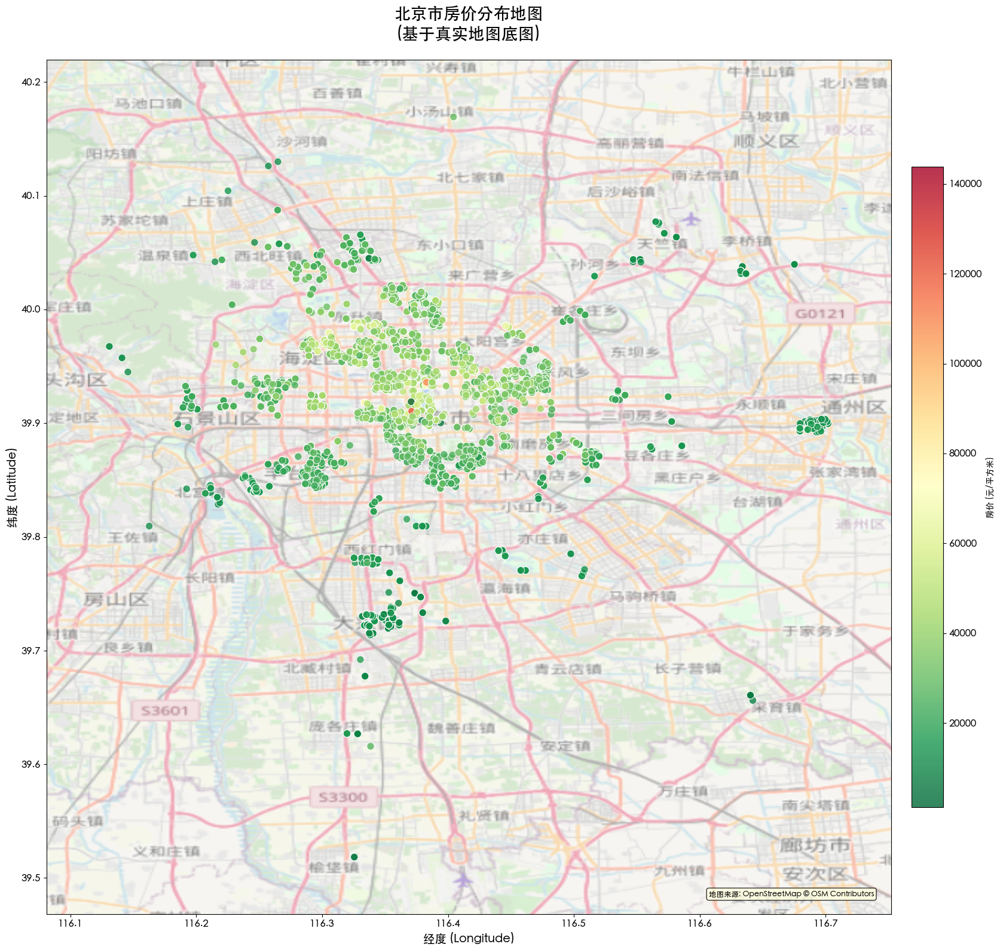


✓ 共绘制 9,475 个房源数据点
✓ 价格范围: ¥1256 - ¥143820 元/平方米
✓ 平均价格: ¥27006/㎡
✓ 地图已保存至: ../image/beijing_house_price_map_with_basemap.png


In [ ]:
import contextily as ctx
import matplotlib.pyplot as plt
import numpy as np

# 提取数据
lons = []
lats = []
prices = []

for house in houses:
    try:
        lon = float(house['lon'])
        lat = float(house['lat'])
        price = float(house['price_per_meter'])
        
        lons.append(lon)
        lats.append(lat)
        prices.append(price)
    except (ValueError, KeyError):
        continue

# 转换为numpy数组
lons = np.array(lons)
lats = np.array(lats)
prices = np.array(prices)

# 创建图形
fig, ax = plt.subplots(figsize=(18, 16))


# 绘制散点图
scatter = ax.scatter(lons, lats, c=prices, cmap='RdYlGn_r', 
                     s=80, alpha=0.8, edgecolors='white', linewidth=0.8,
                     zorder=5)

# 添加真实地图底图（OpenStreetMap）
try:
    ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik, 
                    attribution=False, alpha=0.6, zorder=1)
    map_loaded = True
    print("✓ 地图底图加载成功")
except Exception as e:
    print(f"⚠ 地图底图加载失败: {e}")
    print("  使用备用方案...")
    ax.set_facecolor('#E8F4F8')
    ax.grid(True, alpha=0.3, linestyle='-', linewidth=0.8, color='#CCCCCC')
    map_loaded = False

# 添加颜色条
cbar = plt.colorbar(scatter, ax=ax, label='房价 (元/平方米)', pad=0.02, shrink=0.75)
cbar.ax.tick_params(labelsize=12)

# 设置标题和标签
ax.set_title('北京市房价分布地图\n(基于真实地图底图)', fontsize=20, fontweight='bold', pad=25)
ax.set_xlabel('经度 (Longitude)', fontsize=14, fontweight='bold')
ax.set_ylabel('纬度 (Latitude)', fontsize=14, fontweight='bold')

# 设置坐标轴范围
ax.set_xlim(lons.min() - 0.05, lons.max() + 0.05)
ax.set_ylim(lats.min() - 0.05, lats.max() + 0.05)

# 设置刻度格式
ax.tick_params(labelsize=12)

"""# 添加统计信息
price_stats = f'📊 统计信息\n'
price_stats += f'{"─"*20}\n'
price_stats += f'平均价格: ¥{prices.mean():.0f}/㎡\n'
price_stats += f'中位数价格: ¥{np.median(prices):.0f}/㎡\n'
price_stats += f'最高价格: ¥{prices.max():.0f}/㎡\n'
price_stats += f'最低价格: ¥{prices.min():.0f}/㎡\n'
price_stats += f'标准差: ¥{prices.std():.0f}/㎡\n'
price_stats += f'样本数量: {len(prices):,} 套'

ax.text(0.02, 0.98, price_stats, transform=ax.transAxes,
        fontsize=11, verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.8', facecolor='white', 
                  alpha=0.95, edgecolor='darkblue', linewidth=2),
        zorder=10)"""

# 添加数据来源说明
if map_loaded:
    source_text = '地图来源: OpenStreetMap © OSM Contributors'
else:
    source_text = '备用地图模式'
    
ax.text(0.98, 0.02, source_text, transform=ax.transAxes,
        fontsize=9, horizontalalignment='right', style='italic',
        bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8),
        zorder=10)


plt.tight_layout()
plt.savefig('../image/beijing_house_price_map_with_basemap.png', dpi=600, bbox_inches='tight')
plt.show()

print(f"\n✓ 共绘制 {len(prices):,} 个房源数据点")
print(f"✓ 价格范围: ¥{prices.min():.0f} - ¥{prices.max():.0f} 元/平方米")
print(f"✓ 平均价格: ¥{prices.mean():.0f}/㎡")
print(f"✓ 地图已保存至: ../image/beijing_house_price_map_with_basemap_v1.png")

## 浅色底图

✓ 地图底图加载成功


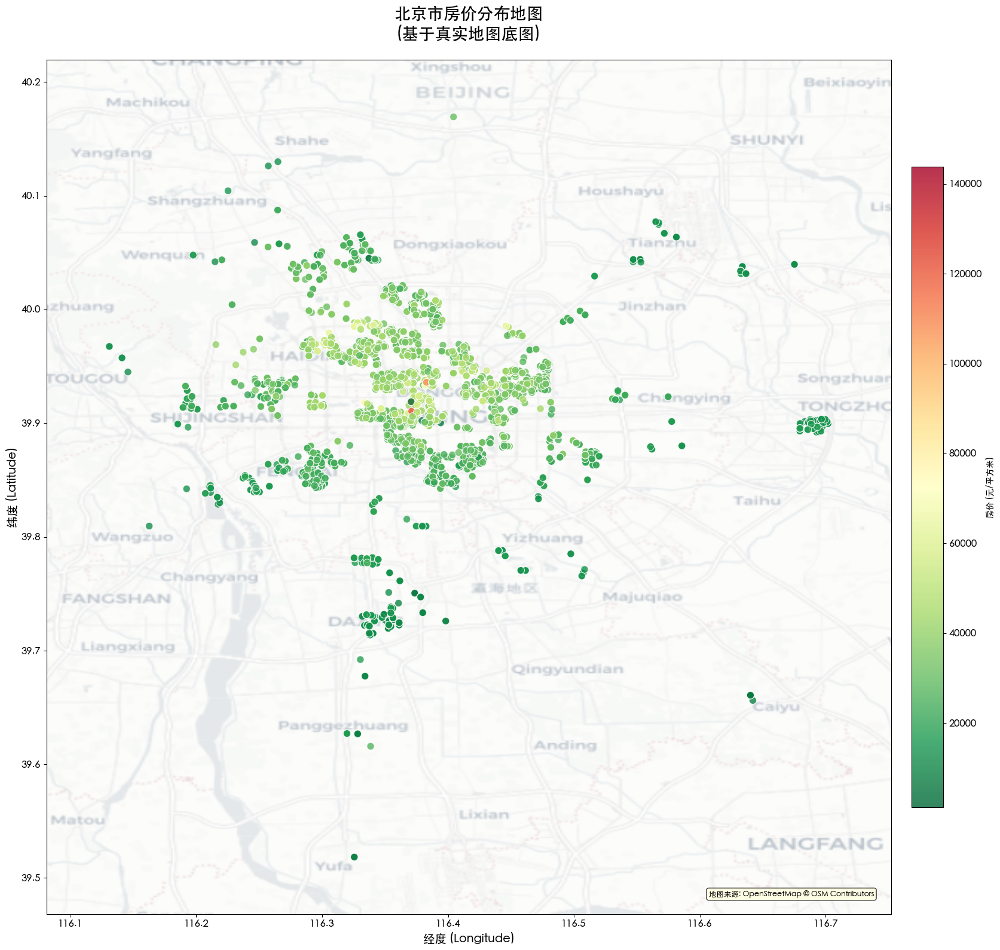


✓ 共绘制 9,475 个房源数据点
✓ 价格范围: ¥1256 - ¥143820 元/平方米
✓ 平均价格: ¥27006/㎡
✓ 地图已保存至: ../image/beijing_house_price_map_with_basemap.png


In [11]:
import contextily as ctx
import matplotlib.pyplot as plt
import numpy as np

# 提取数据
lons = []
lats = []
prices = []

for house in houses:
    try:
        lon = float(house['lon'])
        lat = float(house['lat'])
        price = float(house['price_per_meter'])
        
        lons.append(lon)
        lats.append(lat)
        prices.append(price)
    except (ValueError, KeyError):
        continue

# 转换为numpy数组
lons = np.array(lons)
lats = np.array(lats)
prices = np.array(prices)

# 创建图形
fig, ax = plt.subplots(figsize=(18, 16))


# 绘制散点图
scatter = ax.scatter(lons, lats, c=prices, cmap='RdYlGn_r', 
                     s=80, alpha=0.8, edgecolors='white', linewidth=0.8,
                     zorder=5)

# 添加真实地图底图（OpenStreetMap）
try:
    ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Positron, 
                    attribution=False, alpha=0.6, zorder=1)
    map_loaded = True
    print("✓ 地图底图加载成功")
except Exception as e:
    print(f"⚠ 地图底图加载失败: {e}")
    print("  使用备用方案...")
    ax.set_facecolor('#E8F4F8')
    ax.grid(True, alpha=0.3, linestyle='-', linewidth=0.8, color='#CCCCCC')
    map_loaded = False

# 添加颜色条
cbar = plt.colorbar(scatter, ax=ax, label='房价 (元/平方米)', pad=0.02, shrink=0.75)
cbar.ax.tick_params(labelsize=12)

# 设置标题和标签
ax.set_title('北京市房价分布地图\n(基于真实地图底图)', fontsize=20, fontweight='bold', pad=25)
ax.set_xlabel('经度 (Longitude)', fontsize=14, fontweight='bold')
ax.set_ylabel('纬度 (Latitude)', fontsize=14, fontweight='bold')

# 设置坐标轴范围
ax.set_xlim(lons.min() - 0.05, lons.max() + 0.05)
ax.set_ylim(lats.min() - 0.05, lats.max() + 0.05)

# 设置刻度格式
ax.tick_params(labelsize=12)

"""# 添加统计信息
price_stats = f'📊 统计信息\n'
price_stats += f'{"─"*20}\n'
price_stats += f'平均价格: ¥{prices.mean():.0f}/㎡\n'
price_stats += f'中位数价格: ¥{np.median(prices):.0f}/㎡\n'
price_stats += f'最高价格: ¥{prices.max():.0f}/㎡\n'
price_stats += f'最低价格: ¥{prices.min():.0f}/㎡\n'
price_stats += f'标准差: ¥{prices.std():.0f}/㎡\n'
price_stats += f'样本数量: {len(prices):,} 套'

ax.text(0.02, 0.98, price_stats, transform=ax.transAxes,
        fontsize=11, verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.8', facecolor='white', 
                  alpha=0.95, edgecolor='darkblue', linewidth=2),
        zorder=10)"""

# 添加数据来源说明
if map_loaded:
    source_text = '地图来源: OpenStreetMap © OSM Contributors'
else:
    source_text = '备用地图模式'
    
ax.text(0.98, 0.02, source_text, transform=ax.transAxes,
        fontsize=9, horizontalalignment='right', style='italic',
        bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8),
        zorder=10)

plt.tight_layout()
plt.savefig('../image/beijing_house_price_map_with_basemap.png', dpi=600, bbox_inches='tight')
plt.show()

print(f"\n✓ 共绘制 {len(prices):,} 个房源数据点")
print(f"✓ 价格范围: ¥{prices.min():.0f} - ¥{prices.max():.0f} 元/平方米")
print(f"✓ 平均价格: ¥{prices.mean():.0f}/㎡")
print(f"✓ 地图已保存至: ../image/beijing_house_price_map_with_basemap.png")

## 深色底图

✓ 地图底图加载成功


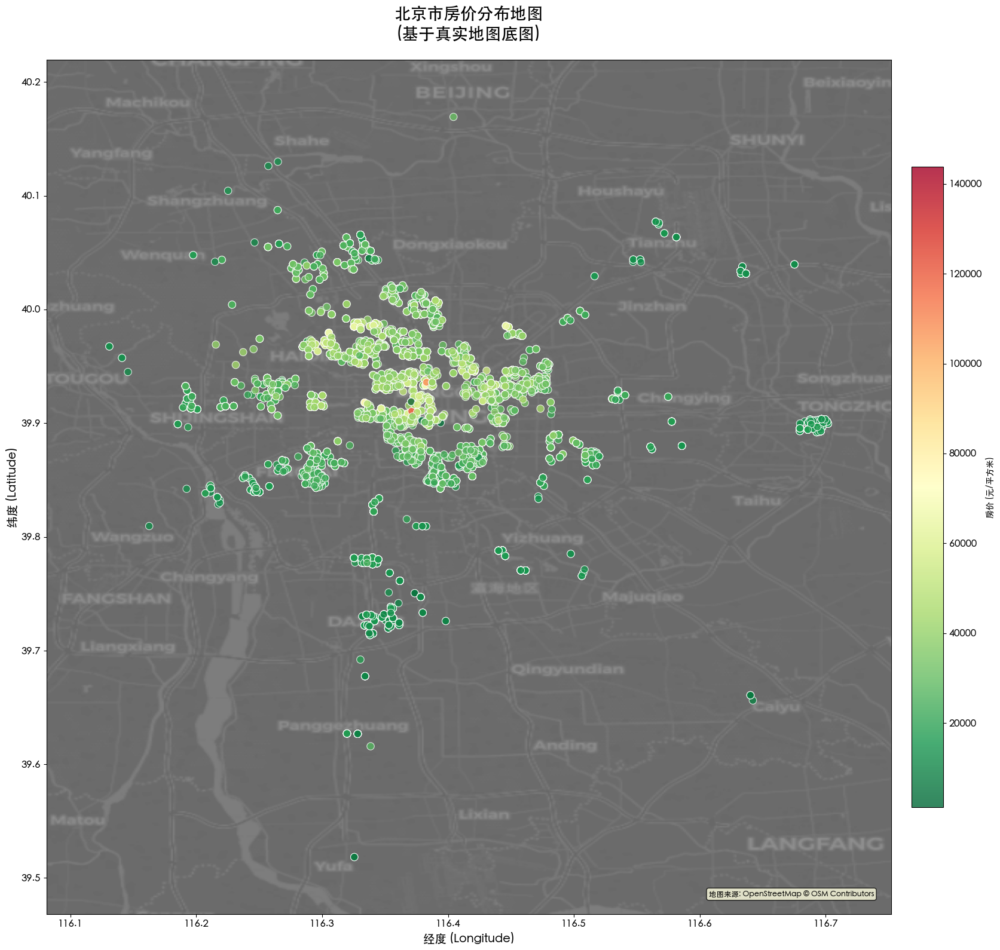


✓ 共绘制 9,475 个房源数据点
✓ 价格范围: ¥1256 - ¥143820 元/平方米
✓ 平均价格: ¥27006/㎡
✓ 地图已保存至: ../image/beijing_house_price_map_with_basemap.png


In [12]:
import contextily as ctx
import matplotlib.pyplot as plt
import numpy as np

# 提取数据
lons = []
lats = []
prices = []

for house in houses:
    try:
        lon = float(house['lon'])
        lat = float(house['lat'])
        price = float(house['price_per_meter'])
        
        lons.append(lon)
        lats.append(lat)
        prices.append(price)
    except (ValueError, KeyError):
        continue

# 转换为numpy数组
lons = np.array(lons)
lats = np.array(lats)
prices = np.array(prices)

# 创建图形
fig, ax = plt.subplots(figsize=(18, 16))


# 绘制散点图
scatter = ax.scatter(lons, lats, c=prices, cmap='RdYlGn_r', 
                     s=80, alpha=0.8, edgecolors='white', linewidth=0.8,
                     zorder=5)

# 添加真实地图底图（OpenStreetMap）
try:
    ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.DarkMatter, 
                    attribution=False, alpha=0.6, zorder=1)
    map_loaded = True
    print("✓ 地图底图加载成功")
except Exception as e:
    print(f"⚠ 地图底图加载失败: {e}")
    print("  使用备用方案...")
    ax.set_facecolor('#E8F4F8')
    ax.grid(True, alpha=0.3, linestyle='-', linewidth=0.8, color='#CCCCCC')
    map_loaded = False

# 添加颜色条
cbar = plt.colorbar(scatter, ax=ax, label='房价 (元/平方米)', pad=0.02, shrink=0.75)
cbar.ax.tick_params(labelsize=12)

# 设置标题和标签
ax.set_title('北京市房价分布地图\n(基于真实地图底图)', fontsize=20, fontweight='bold', pad=25)
ax.set_xlabel('经度 (Longitude)', fontsize=14, fontweight='bold')
ax.set_ylabel('纬度 (Latitude)', fontsize=14, fontweight='bold')

# 设置坐标轴范围
ax.set_xlim(lons.min() - 0.05, lons.max() + 0.05)
ax.set_ylim(lats.min() - 0.05, lats.max() + 0.05)

# 设置刻度格式
ax.tick_params(labelsize=12)

"""# 添加统计信息
price_stats = f'📊 统计信息\n'
price_stats += f'{"─"*20}\n'
price_stats += f'平均价格: ¥{prices.mean():.0f}/㎡\n'
price_stats += f'中位数价格: ¥{np.median(prices):.0f}/㎡\n'
price_stats += f'最高价格: ¥{prices.max():.0f}/㎡\n'
price_stats += f'最低价格: ¥{prices.min():.0f}/㎡\n'
price_stats += f'标准差: ¥{prices.std():.0f}/㎡\n'
price_stats += f'样本数量: {len(prices):,} 套'

ax.text(0.02, 0.98, price_stats, transform=ax.transAxes,
        fontsize=11, verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.8', facecolor='white', 
                  alpha=0.95, edgecolor='darkblue', linewidth=2),
        zorder=10)"""

# 添加数据来源说明
if map_loaded:
    source_text = '地图来源: OpenStreetMap © OSM Contributors'
else:
    source_text = '备用地图模式'
    
ax.text(0.98, 0.02, source_text, transform=ax.transAxes,
        fontsize=9, horizontalalignment='right', style='italic',
        bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8),
        zorder=10)

plt.tight_layout()
plt.savefig('../image/beijing_house_price_map_with_basemap.png', dpi=600, bbox_inches='tight')
plt.show()

print(f"\n✓ 共绘制 {len(prices):,} 个房源数据点")
print(f"✓ 价格范围: ¥{prices.min():.0f} - ¥{prices.max():.0f} 元/平方米")
print(f"✓ 平均价格: ¥{prices.mean():.0f}/㎡")
print(f"✓ 地图已保存至: ../image/beijing_house_price_map_with_basemap.png")

## 卫星图

✓ 地图底图加载成功


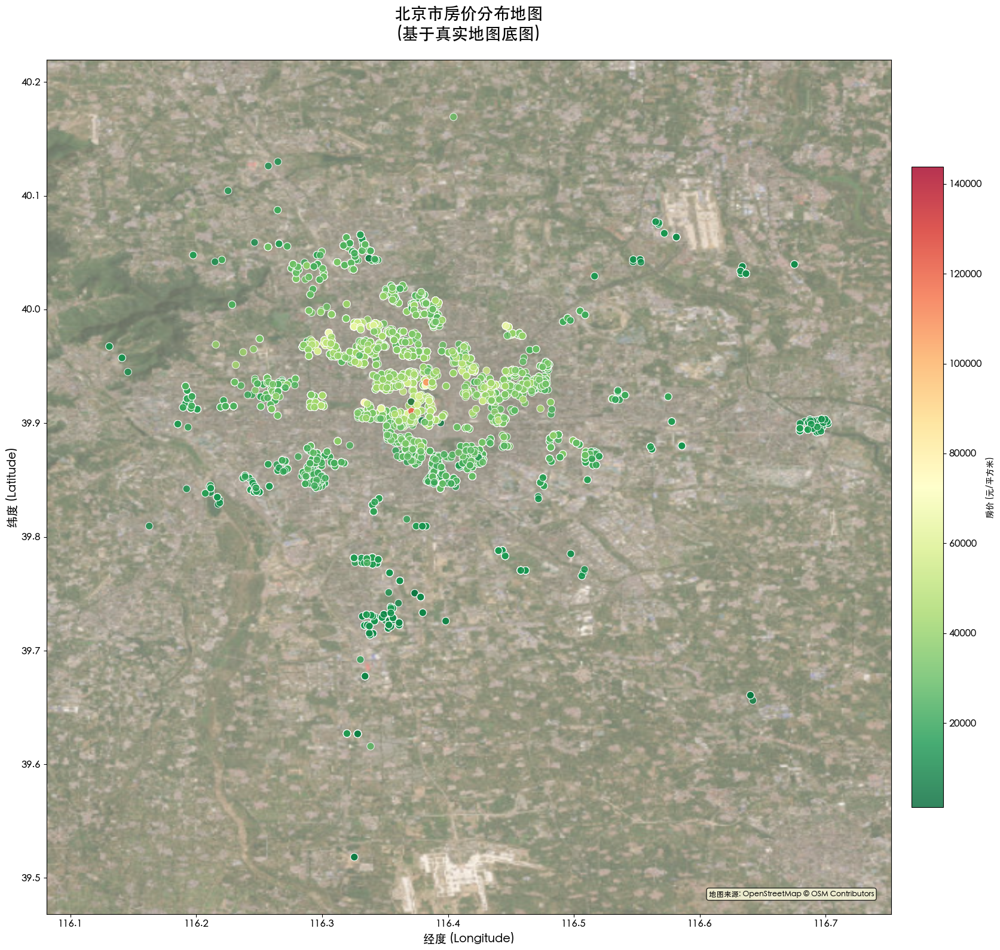


✓ 共绘制 9,475 个房源数据点
✓ 价格范围: ¥1256 - ¥143820 元/平方米
✓ 平均价格: ¥27006/㎡
✓ 地图已保存至: ../image/beijing_house_price_map_with_basemap_v2.png


In [15]:
import contextily as ctx
import matplotlib.pyplot as plt
import numpy as np

# 提取数据
lons = []
lats = []
prices = []

for house in houses:
    try:
        lon = float(house['lon'])
        lat = float(house['lat'])
        price = float(house['price_per_meter'])
        
        lons.append(lon)
        lats.append(lat)
        prices.append(price)
    except (ValueError, KeyError):
        continue

# 转换为numpy数组
lons = np.array(lons)
lats = np.array(lats)
prices = np.array(prices)

# 创建图形
fig, ax = plt.subplots(figsize=(18, 16))


# 绘制散点图
scatter = ax.scatter(lons, lats, c=prices, cmap='RdYlGn_r', 
                     s=80, alpha=0.8, edgecolors='white', linewidth=0.8,
                     zorder=5)

# 添加真实地图底图（OpenStreetMap）
try:
    ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.Esri.WorldImagery,
                    attribution=False, alpha=0.6, zorder=1)
    map_loaded = True
    print("✓ 地图底图加载成功")
except Exception as e:
    print(f"⚠ 地图底图加载失败: {e}")
    print("  使用备用方案...")
    ax.set_facecolor('#E8F4F8')
    ax.grid(True, alpha=0.3, linestyle='-', linewidth=0.8, color='#CCCCCC')
    map_loaded = False

# 添加颜色条
cbar = plt.colorbar(scatter, ax=ax, label='房价 (元/平方米)', pad=0.02, shrink=0.75)
cbar.ax.tick_params(labelsize=12)

# 设置标题和标签
ax.set_title('北京市房价分布地图\n(基于真实地图底图)', fontsize=20, fontweight='bold', pad=25)
ax.set_xlabel('经度 (Longitude)', fontsize=14, fontweight='bold')
ax.set_ylabel('纬度 (Latitude)', fontsize=14, fontweight='bold')

# 设置坐标轴范围
ax.set_xlim(lons.min() - 0.05, lons.max() + 0.05)
ax.set_ylim(lats.min() - 0.05, lats.max() + 0.05)

# 设置刻度格式
ax.tick_params(labelsize=12)

"""# 添加统计信息
price_stats = f'📊 统计信息\n'
price_stats += f'{"─"*20}\n'
price_stats += f'平均价格: ¥{prices.mean():.0f}/㎡\n'
price_stats += f'中位数价格: ¥{np.median(prices):.0f}/㎡\n'
price_stats += f'最高价格: ¥{prices.max():.0f}/㎡\n'
price_stats += f'最低价格: ¥{prices.min():.0f}/㎡\n'
price_stats += f'标准差: ¥{prices.std():.0f}/㎡\n'
price_stats += f'样本数量: {len(prices):,} 套'

ax.text(0.02, 0.98, price_stats, transform=ax.transAxes,
        fontsize=11, verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.8', facecolor='white', 
                  alpha=0.95, edgecolor='darkblue', linewidth=2),
        zorder=10)"""

# 添加数据来源说明
if map_loaded:
    source_text = '地图来源: OpenStreetMap © OSM Contributors'
else:
    source_text = '备用地图模式'
    
ax.text(0.98, 0.02, source_text, transform=ax.transAxes,
        fontsize=9, horizontalalignment='right', style='italic',
        bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8),
        zorder=10)

plt.tight_layout()
plt.savefig('../image/beijing_house_price_map_with_basemap.png', dpi=600, bbox_inches='tight')
plt.show()

print(f"\n✓ 共绘制 {len(prices):,} 个房源数据点")
print(f"✓ 价格范围: ¥{prices.min():.0f} - ¥{prices.max():.0f} 元/平方米")
print(f"✓ 平均价格: ¥{prices.mean():.0f}/㎡")
print(f"✓ 地图已保存至: ../image/beijing_house_price_map_with_basemap_v2.png")

## 

## 原图基础上添加poi子图

✓ 地图底图加载成功


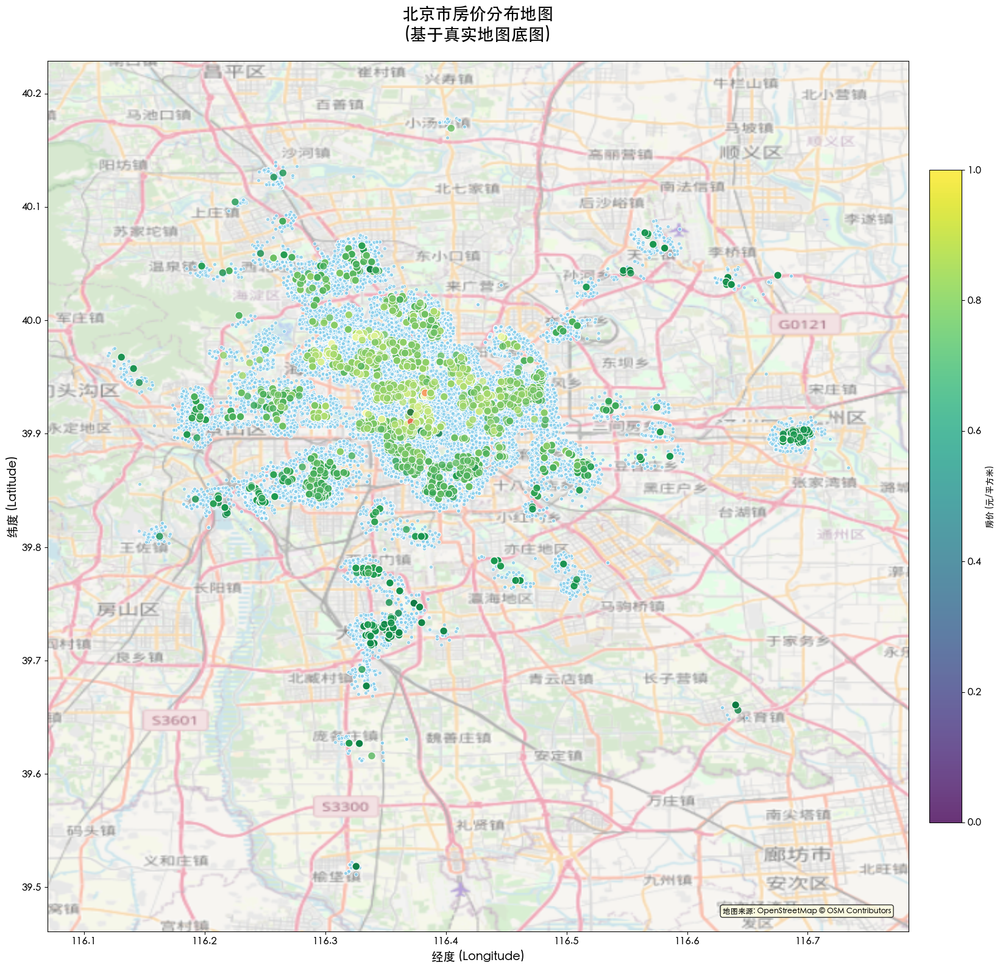


✓ 共绘制 9,475 个房源数据点
✓ 价格范围: ¥1256 - ¥143820 元/平方米
✓ 平均价格: ¥27006/㎡
✓ 地图已保存至: ../image/beijing_house_price_map_with_basemap_v1.png


In [14]:
import contextily as ctx
import matplotlib.pyplot as plt
import numpy as np

# 提取房屋数据
lons = []
lats = []
prices = []

for house in houses:
    try:
        lon = float(house['lon'])
        lat = float(house['lat'])
        price = float(house['price_per_meter'])
        
        lons.append(lon)
        lats.append(lat)
        prices.append(price)
    except (ValueError, KeyError):
        continue

# 转换为numpy数组
lons = np.array(lons)
lats = np.array(lats)
prices = np.array(prices)

# 创建图形
fig, ax = plt.subplots(figsize=(18, 16))

# 绘制散点图
scatter = ax.scatter(lons, lats, c=prices, cmap='RdYlGn_r', 
                     s=80, alpha=0.8, edgecolors='white', linewidth=0.8,
                     zorder=5)

# 提取poi数据
lons = []
lats = []

for poi in pois:
    try:
        lon = float(poi['lon'])
        lat = float(poi['lat'])
        
        lons.append(lon)
        lats.append(lat)
    except (ValueError, KeyError):
        continue

# 转换为numpy数组
lons = np.array(lons)
lats = np.array(lats)

# 绘制散点图
scatter = ax.scatter(lons, lats, c='#87CEEB', 
                     s=20, alpha=0.8, edgecolors='white', linewidth=0.8,
                     zorder=4)


# 添加真实地图底图（OpenStreetMap）
try:
    ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik, 
                    attribution=False, alpha=0.6, zorder=1)
    map_loaded = True
    print("✓ 地图底图加载成功")
except Exception as e:
    print(f"⚠ 地图底图加载失败: {e}")
    print("  使用备用方案...")
    ax.set_facecolor('#E8F4F8')
    ax.grid(True, alpha=0.3, linestyle='-', linewidth=0.8, color='#CCCCCC')
    map_loaded = False

# 添加颜色条
cbar = plt.colorbar(scatter, ax=ax, label='房价 (元/平方米)', pad=0.02, shrink=0.75)
cbar.ax.tick_params(labelsize=12)

# 设置标题和标签
ax.set_title('北京市房价分布地图\n(基于真实地图底图)', fontsize=20, fontweight='bold', pad=25)
ax.set_xlabel('经度 (Longitude)', fontsize=14, fontweight='bold')
ax.set_ylabel('纬度 (Latitude)', fontsize=14, fontweight='bold')

# 设置坐标轴范围
ax.set_xlim(lons.min() - 0.05, lons.max() + 0.05)
ax.set_ylim(lats.min() - 0.05, lats.max() + 0.05)

# 设置刻度格式
ax.tick_params(labelsize=12)

"""# 添加统计信息
price_stats = f'📊 统计信息\n'
price_stats += f'{"─"*20}\n'
price_stats += f'平均价格: ¥{prices.mean():.0f}/㎡\n'
price_stats += f'中位数价格: ¥{np.median(prices):.0f}/㎡\n'
price_stats += f'最高价格: ¥{prices.max():.0f}/㎡\n'
price_stats += f'最低价格: ¥{prices.min():.0f}/㎡\n'
price_stats += f'标准差: ¥{prices.std():.0f}/㎡\n'
price_stats += f'样本数量: {len(prices):,} 套'

ax.text(0.02, 0.98, price_stats, transform=ax.transAxes,
        fontsize=11, verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.8', facecolor='white', 
                  alpha=0.95, edgecolor='darkblue', linewidth=2),
        zorder=10)"""

# 添加数据来源说明
if map_loaded:
    source_text = '地图来源: OpenStreetMap © OSM Contributors'
else:
    source_text = '备用地图模式'
    
ax.text(0.98, 0.02, source_text, transform=ax.transAxes,
        fontsize=9, horizontalalignment='right', style='italic',
        bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8),
        zorder=10)


plt.tight_layout()
plt.savefig('../image/beijing_house_price_map_with_basemap.png', dpi=600, bbox_inches='tight')
plt.show()

print(f"\n✓ 共绘制 {len(prices):,} 个房源数据点")
print(f"✓ 价格范围: ¥{prices.min():.0f} - ¥{prices.max():.0f} 元/平方米")
print(f"✓ 平均价格: ¥{prices.mean():.0f}/㎡")
print(f"✓ 地图已保存至: ../image/beijing_house_price_map_with_basemap_v1.png")